In [1]:
import os
import time
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
from scipy.sparse import csr_matrix
import logging
#from skbio.stats.composition import clr

import matplotlib.pyplot as plt
import matplotlib.axes as axes
#For CLR of ADTs
import scipy
import scipy.stats
from sklearn.preprocessing import scale

BILLING_PROJECT_ID = os.environ['WORKSPACE_NAMESPACE']
WORKSPACE = os.environ['WORKSPACE_NAME']
bucket = os.environ['WORKSPACE_BUCKET']

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')



scanpy==1.9.3 anndata==0.8.0 umap==0.5.3 numpy==1.21.6 scipy==1.7.3 pandas==1.3.5 scikit-learn==1.0.2 statsmodels==0.13.5 python-igraph==0.10.6 pynndescent==0.5.10


#### starting from cell type annotated h5ad file.

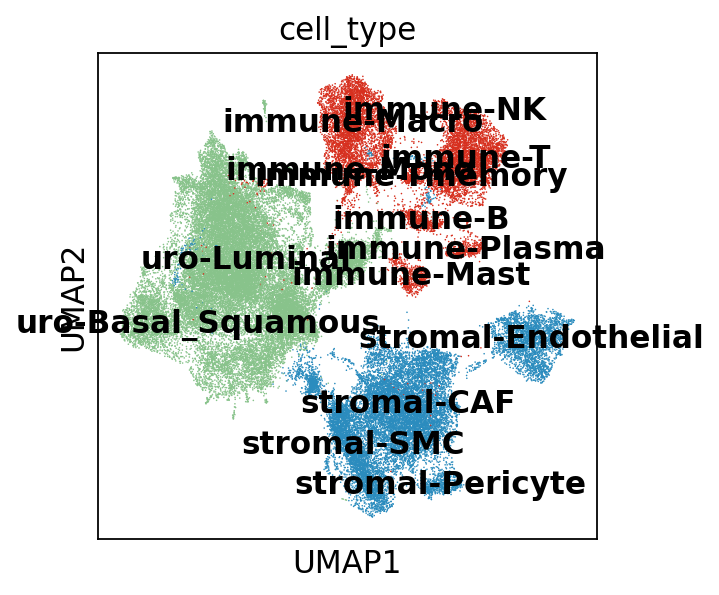

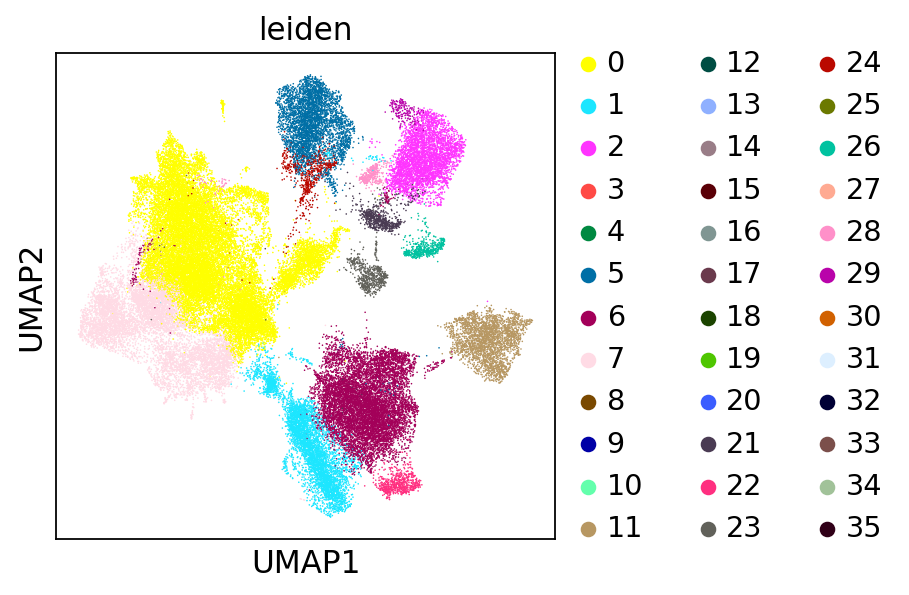

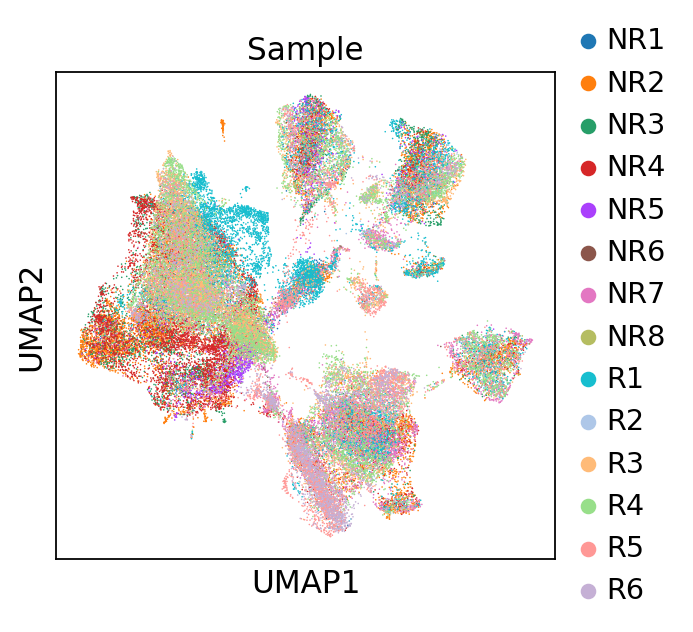

In [ ]:
adata_concat = sc.read_h5ad("final_obj_high_resolution_annotated.h5ad")
adata_concat
sc.pl.umap(adata_concat, color=['cell_type'],   legend_loc = 'on data', show = True)
sc.pl.umap(adata_concat, color=['leiden'],  show = True)
sc.pl.umap(adata_concat, color=['Sample'],  show = True)

In [27]:
adata_concat.obs['c_leiden'] = adata_concat.obs['cell_type']

In [28]:
leiden_dict={
     "immune-B":"0",
    "immune-Macro":"1",
    "immune-Mast":"10",
    "immune-Mono":"11",
    "immune-NK":"12",
    "immune-Plasma":"13",
    "immune-T":"2",
    "immune-Tmemory":"3",
    "stromal-CAF":"4",
     "stromal-Endothelial":"5",
     "stromal-Pericyte":"6",
    "stromal-SMC":"7",
     "uro-Basal_Squamous":"8",
    "uro-Luminal":"9"
                             

    

}

adata_concat.obs['c_leiden']= adata_concat.obs['cell_type'].map(leiden_dict)
adata_concat.obs['c_leiden']=adata_concat.obs['c_leiden'].astype('str').astype('category')

In [32]:
leiden_prop = dict()
no_clusters = len(adata_concat.obs['batch'].unique())
for sn in adata_concat.obs['c_leiden'].unique():
    temp = adata_concat[adata_concat.obs['c_leiden'] == sn,:]
    cell_count = temp.obs['batch'].value_counts()
    cell_count = cell_count.sort_index()
    cell_count = cell_count.to_dict()
    cell_count = [cell_count[str(x)] if str(x) in cell_count.keys() else 0 for x in range(0,no_clusters)]
    leiden_prop[sn] = cell_count

In [33]:
leiden_prop = pd.DataFrame(leiden_prop).T

In [34]:
leiden_prop['total'] = leiden_prop.sum(axis = 1)
leiden_prct = pd.DataFrame()
for x in leiden_prop.columns:
    leiden_prct[x] = leiden_prop[x]/leiden_prop[x].sum()
leiden_prct = leiden_prct.sort_index()

In [35]:
leiden_prct.set_axis([
             'NR1',
             'NR2',
             'NR3',
             'NR4',
             'NR5',
             'NR6',
             'NR7',
             'NR8',
             'R1',
             'R2',
             'R3',
             'R4',
             'R5',
             'R6'
    ,'total'], axis="columns", inplace=True)

In [36]:
sc.pl.umap(adata_concat, color=['cell_type'], palette='tab20b',  show = True)
leiden_prct.T.plot.bar(stacked=True, legend = False,figsize=(5,5), width=0.90, color=[ "#C2E084",
"#AFAF73",
"#AFC7E8",
"#5B5D41",
"#DC8E55",
"#d276cc",
"#f2ba69",
"#F5E3A3",
"#cc6666",
"#F4C7BE",
"#FF8696",
"#97598A",
"#6666cc",
"#49479F"
                                                                        ])

plt.legend([ "immune-B",
    "immune-Macro",
    "immune-Mast",
    "immune-Mono",
    "immune-NK",
    "immune-Plasma",
    "immune-T",
    "immune-Tmemory",
    "stromal-CAF",
     "stromal-Endothelial",
     "stromal-Pericyte",
    "stromal-SMC",
     "uro-Basal_Squamous",
    "uro-Luminal"],
           loc='center left', bbox_to_anchor=(1.0, 0.5), ncol = 1) 
plt.grid(False)
plt.xlabel('Samples')
#plt.imshow('Samples',cmap = 'tab20b')
#plt.colorbar(label='Samples')






Text(0.5, 0, 'Samples')

In [ ]:
### Complete responder with urothelial cells

In [39]:
leiden_prct

df1 = leiden_prct[['R1','R2','R3','R4','R5','R6']]

df1.T.plot.bar(stacked=True, legend = False, width=0.9, figsize=(3,5) ,color=["#C2E084","#AFAF73","#AFC7E8",
"#5B5D41","#DC8E55","#d276cc","#f2ba69","#F5E3A3","#cc6666","#F4C7BE","#FF8696","#97598A","#6666cc","#49479F"
                                                                             ])
#plt.legend(['urothelial','T','B','plasma','mono','myelo/macro','mast','CAF','SMC','Endothelial','pericyte'],loc='center left', bbox_to_anchor=(1.0, 0.5), ncol = 3) 
plt.xlabel('Samples')
plt.grid(False)
plt.title("Complete responder with urothelial cells")

Text(0.5, 1.0, 'Complete responder with urothelial cells')

In [ ]:
### Non responder with urothelial cells

In [41]:
df2 = leiden_prct[['NR1',
             'NR2',
             'NR3',
             'NR4',
             'NR5',
             'NR6',
             'NR7',
             'NR8',]]

df2.T.plot.bar(stacked=True, legend = False, figsize=(4,5), width=0.9, color=["#C2E084","#AFAF73","#AFC7E8",
"#5B5D41","#DC8E55","#d276cc","#f2ba69","#F5E3A3","#cc6666","#F4C7BE","#FF8696","#97598A","#6666cc","#49479F"
                                                                  ])
plt.legend([ "immune-B",
    "immune-Macro",
    "immune-Mast",
    "immune-Mono",
    "immune-NK",
    "immune-Plasma",
    "immune-T",
    "immune-Tmemory",
    "stromal-CAF",
     "stromal-Endothelial",
     "stromal-Pericyte",
    "stromal-SMC",
     "uro-Basal_Squamous",
    "uro-Luminal"],
           loc='center left', bbox_to_anchor=(1.0, 0.5), ncol = 1) 

plt.grid(False)
plt.xlabel('Samples')
plt.title("Non-responder with urothelial cells")

Text(0.5, 1.0, 'Non-responder with urothelial cells')

In [ ]:
### Complete responder without urothelial cells

In [42]:
ob_select = adata_concat.obs.cell_type != "uro-Basal_Squamous"
ob_barcodes = ob_select.index[ob_select]
df = adata_concat[ob_barcodes,:]

In [44]:
ob_select = df.obs.cell_type != "uro-Luminal"
ob_barcodes = ob_select.index[ob_select]
df = df[ob_barcodes,:]

In [46]:
leiden_prop = dict()
no_clusters = len(df.obs['batch'].unique())
for sn in df.obs['c_leiden'].unique():
    temp = df[df.obs['c_leiden'] == sn,:]
    cell_count = temp.obs['batch'].value_counts()
    cell_count = cell_count.sort_index()
    cell_count = cell_count.to_dict()
    cell_count = [cell_count[str(x)] if str(x) in cell_count.keys() else 0 for x in range(0,no_clusters)]
    leiden_prop[sn] = cell_count

In [47]:
leiden_prop = pd.DataFrame(leiden_prop).T

In [49]:
leiden_prop['total'] = leiden_prop.sum(axis = 1)
leiden_prct = pd.DataFrame()
for x in leiden_prop.columns:
    leiden_prct[x] = leiden_prop[x]/leiden_prop[x].sum()
leiden_prct = leiden_prct.sort_index()

In [50]:

leiden_prct.set_axis(['NR1',
             'NR2',
             'NR3',
             'NR4',
             'NR5',
             'NR6',
             'NR7',
             'NR8',
             'R1',
             'R2',
             'R3',
             'R4',
             'R5',
             'R6','total'], axis="columns", inplace=True)



In [54]:
df1w = leiden_prct[['R1','R2','R3','R4','R5','R6']]

df1w.T.plot.bar(stacked=True, legend = False, figsize=(3,5),width=0.9,color=["#C2E084","#AFAF73","#AFC7E8",
"#5B5D41","#DC8E55","#d276cc","#f2ba69","#F5E3A3","#cc6666","#F4C7BE","#FF8696","#97598A"])
#plt.legend(['T','B','plasma','mono','myelo/macro','mast','CAF','SMC','Endothelial','pericyte'],loc='center left', bbox_to_anchor=(1.0, 0.5), ncol = 3) 
plt.xlabel('Samples')
plt.grid(False)
plt.title("Complete responder without urothelial cells")

Text(0.5, 1.0, 'Complete responder without urothelial cells')

In [ ]:
### Non responder without urothelial cells

In [57]:
df2w = leiden_prct[['NR1',
             'NR2',
             'NR3',
             'NR4',
             'NR5',
             'NR6',
             'NR7',
             'NR8']]

df2w.T.plot.bar(stacked=True, legend = False,figsize=(4,5),width=0.9, color=["#C2E084","#AFAF73","#AFC7E8",
"#5B5D41","#DC8E55","#d276cc","#f2ba69","#F5E3A3","#cc6666","#F4C7BE","#FF8696","#97598A"])
plt.legend(["immune-B",
    "immune-Macro",
    "immune-Mast",
    "immune-Mono",
    "immune-NK",
    "immune-Plasma",
    "immune-T",
    "immune-Tmemory",
    "stromal-CAF",
     "stromal-Endothelial",
     "stromal-Pericyte",
    "stromal-SMC",],
           loc='center left', bbox_to_anchor=(1.0, 0.5), ncol = 1)  
plt.xlabel('Samples')
plt.grid(False)
plt.title("Non-responder without urothelial cells")

Text(0.5, 1.0, 'Non-responder without urothelial cells')